**Milestone1**

In [ ]:
# ✅ Install all required libraries for crowd analysis and visualization
!pip install numpy scipy matplotlib opencv-python h5py tqdm pillow torch torchvision

In [ ]:
import os
import glob
import cv2
import numpy as np
import scipy.io as io
from scipy.ndimage import gaussian_filter
import matplotlib.pyplot as plt
import h5py
import torch
import torch.nn as nn
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from torchvision import models
from PIL import Image
from tqdm import tqdm

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# --- IMPORTANT: SET THIS PATH ---
# This should be the path to the folder in your Drive *containing* the ShanghaiTech folder
# For example, if your dataset is at 'My Drive/Colab Notebooks/ShanghaiTech', set this to:
# DRIVE_PROJECT_PATH = '/content/drive/My Drive/Colab Notebooks/'

DRIVE_PROJECT_PATH = '/content/drive/My Drive/' # <-- EDIT THIS

# ----------------------------------

# This assumes your folder is named 'ShanghaiTech'
DATASET_PATH = os.path.join(DRIVE_PROJECT_PATH, 'ShanghaiTech')
PART_A_PATH = os.path.join(DATASET_PATH, 'part_A')
PART_B_PATH = os.path.join(DATASET_PATH, 'part_B')

# Paths for training and testing data (Part A)
part_a_train_img_path = os.path.join(PART_A_PATH, 'train_data', 'images')
part_a_train_gt_path = os.path.join(PART_A_PATH, 'train_data', 'ground-truth')
part_a_test_img_path = os.path.join(PART_A_PATH, 'test_data', 'images')
part_a_test_gt_path = os.path.join(PART_A_PATH, 'test_data', 'ground-truth')

# We will save our pre-processed data here for faster loading
PREPROCESSED_DATA_PATH = os.path.join(DRIVE_PROJECT_PATH, 'preprocessed_shanghaitech')
os.makedirs(PREPROCESSED_DATA_PATH, exist_ok=True)

print(f"Dataset path: {DATASET_PATH}")
print(f"Preprocessed data will be saved to: {PREPROCESSED_DATA_PATH}")

# Verify paths
if not os.path.exists(part_a_train_img_path):
    print("\n--- ERROR ---")
    print(f"Could not find training images at: {part_a_train_img_path}")
    print("Please double-check your 'DRIVE_PROJECT_PATH' variable.")
else:
    print("\nSuccessfully found dataset paths.")

Dataset path: /content/drive/My Drive/ShanghaiTech
Preprocessed data will be saved to: /content/drive/My Drive/preprocessed_shanghaitech

Successfully found dataset paths.


In [ ]:
def create_density_map(img, points, sigma=15):
    """
    Creates a density map from a list of points.

    Args:
        img: The original image (as a NumPy array) to get the shape.
        points: A NumPy array of (x, y) coordinates.
        sigma: The sigma for the Gaussian kernel.
    """
    img_shape = [img.shape[0], img.shape[1]]
    gt_count = len(points)

    # Create an empty density map
    density_map = np.zeros(img_shape, dtype=np.float32)

    if gt_count == 0:
        return density_map

    for i in range(gt_count):
        x, y = int(points[i][0]), int(points[i][1])

        # Check boundaries
        if x >= img_shape[1] or y >= img_shape[0]:
            continue

        # Create a single-point map
        pt_map = np.zeros(img_shape, dtype=np.float32)
        pt_map[y, x] = 1.0

        # Apply Gaussian filter
        density_map += gaussian_filter(pt_map, sigma=sigma, mode='constant')

    return density_map

In [ ]:
def preprocess_dataset(img_paths, gt_paths, output_h5_path, target_size=None):
    """
    Loads all images and ground-truth .mat files, generates density maps,
    and saves them into a single HDF5 file.
    """
    print(f"Starting preprocessing. Output will be saved to: {output_h5_path}")

    # Check if file already exists to avoid re-processing
    if os.path.exists(output_h5_path):
        print("Preprocessed file already exists. Skipping preprocessing.")
        return

    # Create HDF5 file
    with h5py.File(output_h5_path, 'w') as hf:
        img_names = sorted(glob.glob(os.path.join(img_paths, '*.jpg')))

        for img_path in tqdm(img_names):
            img_name_base = os.path.basename(img_path).replace('.jpg', '')

            # Load .mat file
            gt_path = os.path.join(gt_paths, f'GT_{img_name_base}.mat')
            mat = io.loadmat(gt_path)

            # Load image
            img = plt.imread(img_path)
            # Ensure 3 channels
            if img.ndim == 2:
                img = np.stack((img,) * 3, axis=-1)

            # Get points
            points = mat['image_info'][0, 0][0, 0][0]

            # Create density map
            # We use a smaller sigma for Part A due to higher density
            density_map = create_density_map(img, points, sigma=4)

            # Optional: Resize image and density map
            # For CSRNet, we often don't resize, but the option is here
            if target_size:
                # Resize image
                img_resized = cv2.resize(img, target_size, interpolation=cv2.INTER_CUBIC)

                # Resize density map and scale to maintain count
                scale_y = target_size[1] / img.shape[0]
                scale_x = target_size[0] / img.shape[1]
                density_map_resized = cv2.resize(density_map, target_size, interpolation=cv2.INTER_CUBIC)
                density_map_resized *= (scale_x * scale_y)

                img, density_map = img_resized, density_map_resized

            # Store in HDF5 file
            grp = hf.create_group(img_name_base)
            grp.create_dataset('image', data=img)
            grp.create_dataset('density_map', data=density_map)

    print("Preprocessing complete.")

# Define paths for our preprocessed files
h5_train_path = os.path.join(PREPROCESSED_DATA_PATH, 'part_A_train.h5')
h5_test_path = os.path.join(PREPROCESSED_DATA_PATH, 'part_A_test.h5')

# Run preprocessing
preprocess_dataset(part_a_train_img_path, part_a_train_gt_path, h5_train_path)
preprocess_dataset(part_a_test_img_path, part_a_test_gt_path, h5_test_path)

Starting preprocessing. Output will be saved to: /content/drive/My Drive/preprocessed_shanghaitech/part_A_train.h5
Preprocessed file already exists. Skipping preprocessing.
Starting preprocessing. Output will be saved to: /content/drive/My Drive/preprocessed_shanghaitech/part_A_test.h5
Preprocessed file already exists. Skipping preprocessing.


In [ ]:
class CrowdDataset(Dataset):
    def __init__(self, h5_path, transform=None):
        self.h5_path = h5_path
        self.transform = transform

        with h5py.File(h5_path, 'r') as hf:
            self.img_names = list(hf.keys())

    def __len__(self):
        return len(self.img_names)

    def __getitem__(self, idx):
        img_name = self.img_names[idx]

        with h5py.File(self.h5_path, 'r') as hf:
            img = hf[img_name]['image'][:]
            density_map = hf[img_name]['density_map'][:]

        # Convert to PIL Image for transforms
        img = Image.fromarray(img)

        # Apply transformations
        if self.transform:
            img = self.transform(img)

        # --- Data Augmentation (Manual for density map) ---
        if np.random.rand() > 0.5:
            img = torch.flip(img, [2])
            density_map = np.fliplr(density_map).copy() # Flip density map

        # ---

        # Convert density map to tensor and downsample by 8 (for CSRNet)
        output_h, output_w = img.shape[1] // 8, img.shape[2] // 8
        density_map_downsampled = cv2.resize(density_map, (output_w, output_h),
                                             interpolation=cv2.INTER_CUBIC)

        # Scale density to maintain count after resizing
        scale = (density_map.shape[0] * density_map.shape[1]) / (output_h * output_w)

        # --- THIS IS THE FIX ---
        # The sum of the resized map is roughly (original_sum / scale).
        # We multiply by scale to get back to the original_sum.
        density_map_downsampled *= scale
        # -----------------------

        # Add channel dimension
        density_map_tensor = torch.from_numpy(density_map_downsampled).unsqueeze(0)

        return img, density_map_tensor

Loaded 300 training samples and 103 test samples.

Visualizing one training sample...


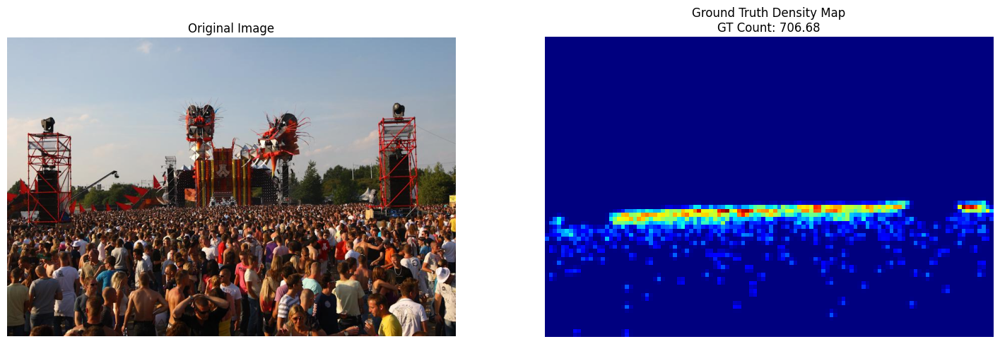

In [ ]:
# Define transformations
# Standard ImageNet normalization
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

# Create Datasets
train_dataset = CrowdDataset(h5_train_path, transform=transform)
test_dataset = CrowdDataset(h5_test_path, transform=transform)

# Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=2)

print(f"Loaded {len(train_dataset)} training samples and {len(test_dataset)} test samples.")

# --- Visualize a Sample ---
print("\nVisualizing one training sample...")

# Get one sample
img_tensor, density_map_tensor = next(iter(train_loader))

# Inverse transform for plotting image
inv_normalize = transforms.Normalize(
   mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
   std=[1/0.229, 1/0.224, 1/0.225]
)
img_to_plot = inv_normalize(img_tensor[0]).permute(1, 2, 0)

# Get GT count (sum of the *downsampled* map)
gt_count = density_map_tensor.sum().item()

# Plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))

ax1.imshow(img_to_plot)
ax1.set_title("Original Image")
ax1.axis('off')

ax2.imshow(density_map_tensor[0, 0], cmap='jet')
ax2.set_title(f"Ground Truth Density Map\nGT Count: {gt_count:.2f}")
ax2.axis('off')

plt.show()

**Milestone 2**

In [ ]:
class CSRNet(nn.Module):
    def __init__(self, load_weights=True):
        super(CSRNet, self).__init__()
        self.frontend_feat = [64, 64, 'M', 128, 128, 'M', 256, 256, 256, 'M', 512, 512, 512]
        self.backend_feat  = [512, 512, 512, 256, 128, 64]

        self.frontend = self.make_layers(self.frontend_feat)
        self.backend = self.make_layers(self.backend_feat, in_channels=512, dilation=True)
        self.output_layer = nn.Conv2d(64, 1, kernel_size=1)

        if load_weights:
            # Load pre-trained VGG16 weights
            vgg16 = models.vgg16(pretrained=True)
            vgg_state_dict = vgg16.state_dict()

            # Create a new state dict for our frontend
            frontend_state_dict = self.frontend.state_dict()

            # Copy the weights
            for k_vgg, k_frontend in zip(vgg_state_dict.keys(), frontend_state_dict.keys()):
                if 'features' in k_vgg:
                    frontend_state_dict[k_frontend] = vgg_state_dict[k_vgg]

            # Load the modified state dict
            self.frontend.load_state_dict(frontend_state_dict)

            # Initialize backend and output layers
            self._initialize_weights()

    def forward(self, x):
        x = self.frontend(x)
        x = self.backend(x)
        x = self.output_layer(x)
        return x

    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.normal_(m.weight, std=0.01)
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)

    def make_layers(self, cfg, in_channels=3, batch_norm=False, dilation=False):
        layers = []
        dilation_rate = 2 if dilation else 1
        for v in cfg:
            if v == 'M':
                layers += [nn.MaxPool2d(kernel_size=2, stride=2)]
            else:
                conv2d = nn.Conv2d(in_channels, v, kernel_size=3, padding=dilation_rate,
                                   dilation=dilation_rate)
                if batch_norm:
                    layers += [conv2d, nn.BatchNorm2d(v), nn.ReLU(inplace=True)]
                else:
                    layers += [conv2d, nn.ReLU(inplace=True)]
                in_channels = v
        return nn.Sequential(*layers)

print("CSRNet model defined.")

CSRNet model defined.


In [ ]:
# Setup device (use GPU if available)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Initialize model and move it to the GPU
model = CSRNet().to(device)

# Define loss function (Mean Squared Error) and optimizer
criterion = nn.MSELoss(reduction='sum').to(device)

# We are keeping the 10x faster learning rate
optimizer = torch.optim.Adam(model.parameters(), lr=1e-5)

# --- Training Parameters ---

# We increased the total epochs to 200
NUM_EPOCHS = 200
# ---------------------------------

CHECKPOINT_DIR = os.path.join(DRIVE_PROJECT_PATH, 'checkpoints')
os.makedirs(CHECKPOINT_DIR, exist_ok=True)

# Path for the *best* model (lowest MAE)
BEST_MODEL_PATH = os.path.join(CHECKPOINT_DIR, 'csrnet_best_model.pth')
# Path for the *latest* checkpoint (for resuming)
LATEST_MODEL_PATH = os.path.join(CHECKPOINT_DIR, 'csrnet_latest_checkpoint.pth')

print(f"Set to train for {NUM_EPOCHS} total epochs with LR=1e-5.")
print(f"Checkpoints will be saved in: {CHECKPOINT_DIR}")

Using device: cpu


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


100%|██████████| 528M/528M [00:03<00:00, 147MB/s]


Set to train for 200 total epochs with LR=1e-5.
Checkpoints will be saved in: /content/drive/My Drive/checkpoints


In [ ]:
import time

best_mae = float('inf')
start_epoch = 0 # Default to starting from epoch 0

# --- Load Checkpoint if it Exists ---
if os.path.exists(LATEST_MODEL_PATH):
    print(f"--- Found latest checkpoint. Resuming training from: {LATEST_MODEL_PATH} ---")

    # Load the checkpoint
    checkpoint = torch.load(LATEST_MODEL_PATH, map_location=device)

    # Load model state (this keeps your 44 epochs of progress)
    model.load_state_dict(checkpoint['model_state_dict'])

    # --- THIS LINE IS COMMENTED OUT ON PURPOSE ---
    # We do NOT load the old optimizer state, so it uses the new one
    # with the lr=1e-5 we just defined in Step 2.2
    # optimizer.load_state_dict(checkpoint['optimizer_state_dict'])

    # Load the epoch to start from
    start_epoch = checkpoint['epoch'] + 1

    # Load the best MAE score achieved so far
    best_mae = checkpoint['best_mae']

    print(f"--- Resuming from Epoch {start_epoch + 1} with new LR=1e-5 ---")
    print(f"--- Best MAE so far: {best_mae:.2f} ---")
else:
    print("--- No checkpoint found. Starting training from scratch. ---")

# -----------------------------------------------

print("--- Starting Training ---")

# The loop now starts from 'start_epoch' (e.g., 44) up to 150
for epoch in range(start_epoch, NUM_EPOCHS):
    epoch_start_time = time.time()

    # --- Training Phase ---
    model.train()
    train_loss = 0.0

    for inputs, targets in tqdm(train_loader, desc=f"Epoch {epoch+1}/{NUM_EPOCHS} [Train]"):
        inputs = inputs.to(device)
        targets = targets.to(device)

        # --- THIS IS THE FIX ---
        optimizer.zero_grad() # Was optimizer.zero_.grad()
        # -----------------------

        outputs = model(inputs)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()

    avg_train_loss = train_loss / len(train_loader)

    # --- Validation Phase ---
    model.eval()
    val_mae = 0.0
    val_mse = 0.0

    with torch.no_grad():
        for inputs, targets in tqdm(test_loader, desc=f"Epoch {epoch+1}/{NUM_EPOCHS} [Val]"):
            inputs = inputs.to(device)
            targets = targets.to(device)

            outputs = model(inputs)

            pred_count = outputs.sum().item()
            gt_count = targets.sum().item()

            val_mae += abs(pred_count - gt_count)
            val_mse += (pred_count - gt_count)**2

    avg_val_mae = val_mae / len(test_loader)
    avg_val_mse = (val_mse / len(test_loader))**0.5

    epoch_time = time.time() - epoch_start_time

    print(f"\nEpoch {epoch+1}/{NUM_EPOCHS} ({epoch_time:.2f}s) -> "
          f"Train Loss: {avg_train_loss:.4f} | "
          f"Val MAE: {avg_val_mae:.2f} | "
          f"Val MSE: {avg_val_mse:.2f}")

    # --- Check for Best Model ---
    is_best = avg_val_mae < best_mae
    if is_best:
        best_mae = avg_val_mae
        # Save the best model
        torch.save(model.state_dict(), BEST_MODEL_PATH)
        print(f"*** New best model saved! MAE: {best_mae:.2f} ***")

    # --- Save Latest Checkpoint ---
    # This now saves the model and the *new* optimizer state
    checkpoint_data = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'best_mae': best_mae,
        'train_loss': avg_train_loss
    }
    torch.save(checkpoint_data, LATEST_MODEL_PATH)

print("--- Training Complete ---")
print(f"Best validation MAE: {best_mae:.2f}")
print(f"Best model saved to: {BEST_MODEL_PATH}")
print(f"Latest checkpoint saved to: {LATEST_MODEL_PATH}")

--- Found latest checkpoint. Resuming training from: /content/drive/My Drive/checkpoints/csrnet_latest_checkpoint.pth ---
--- Resuming from Epoch 201 with new LR=1e-5 ---
--- Best MAE so far: 130.23 ---
--- Starting Training ---
--- Training Complete ---
Best validation MAE: 130.23
Best model saved to: /content/drive/My Drive/checkpoints/csrnet_best_model.pth
Latest checkpoint saved to: /content/drive/My Drive/checkpoints/csrnet_latest_checkpoint.pth


Successfully loaded best model from: /content/drive/My Drive/checkpoints/csrnet_best_model.pth

--- Displaying 5 Test Samples ---

--- Sample 1/5 ---


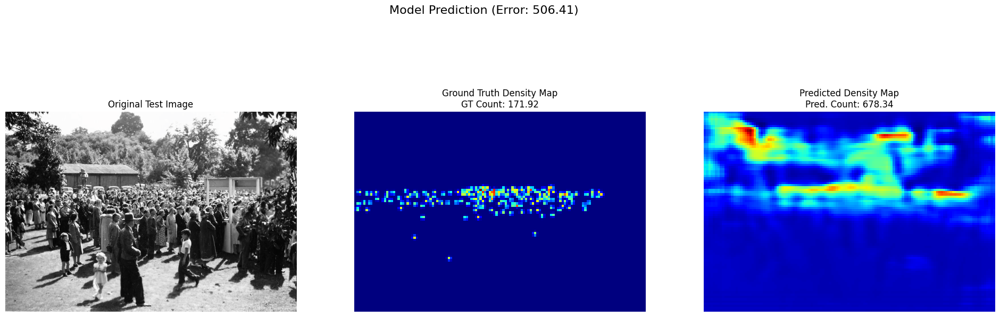


--- Sample 2/5 ---


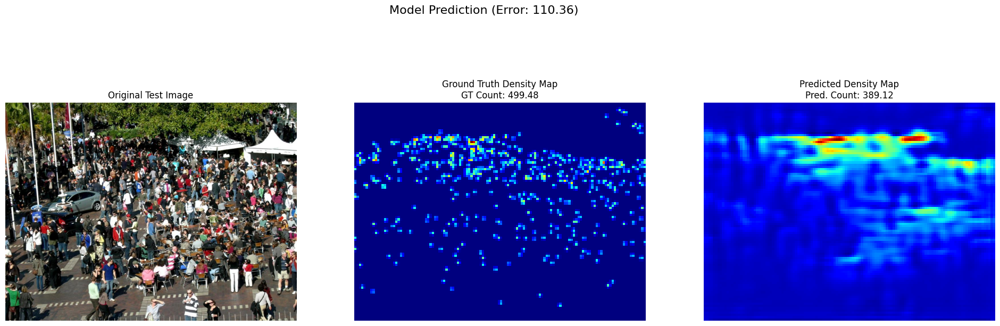


--- Sample 3/5 ---


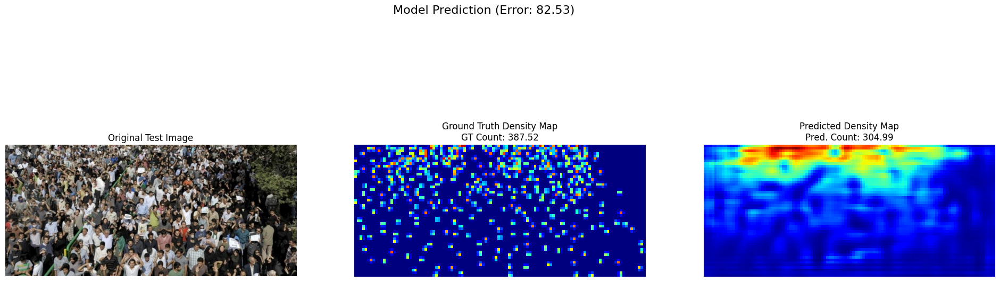


--- Sample 4/5 ---


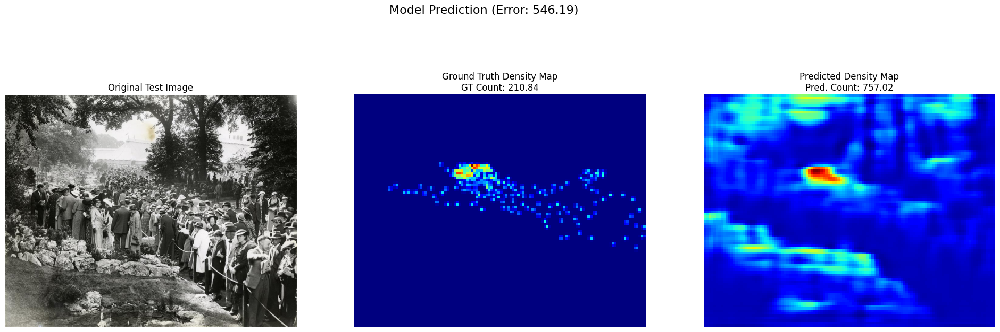


--- Sample 5/5 ---


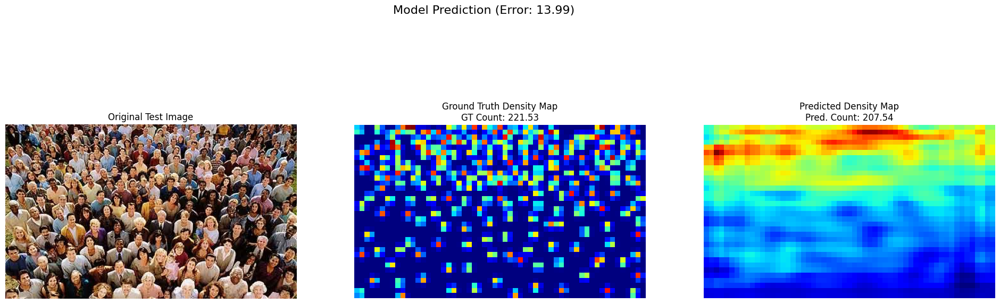

In [ ]:
# --- Re-define the CSRNet class ---
# (In case the runtime was reset. This is just copy-pasting Step 2.1)
class CSRNet(nn.Module):
    def __init__(self, load_weights=False): # Set load_weights=False, we load our own
        super(CSRNet, self).__init__()
        self.frontend_feat = [64, 64, 'M', 128, 128, 'M', 256, 256, 256, 'M', 512, 512, 512]
        self.backend_feat  = [512, 512, 512, 256, 128, 64]
        self.frontend = self.make_layers(self.frontend_feat)
        self.backend = self.make_layers(self.backend_feat, in_channels=512, dilation=True)
        self.output_layer = nn.Conv2d(64, 1, kernel_size=1)
        if not load_weights:
            self._initialize_weights()

    def forward(self, x):
        x = self.frontend(x)
        x = self.backend(x)
        x = self.output_layer(x)
        return x

    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.normal_(m.weight, std=0.01)
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)

    def make_layers(self, cfg, in_channels=3, batch_norm=False, dilation=False):
        layers = []
        dilation_rate = 2 if dilation else 1
        for v in cfg:
            if v == 'M':
                layers += [nn.MaxPool2d(kernel_size=2, stride=2)]
            else:
                conv2d = nn.Conv2d(in_channels, v, kernel_size=3, padding=dilation_rate,
                                   dilation=dilation_rate)
                if batch_norm:
                    layers += [conv2d, nn.BatchNorm2d(v), nn.ReLU(inplace=True)]
                else:
                    layers += [conv2d, nn.ReLU(inplace=True)]
                in_channels = v
        return nn.Sequential(*layers)

# -----------------------------------------------------------------
# --- Now we load and test your saved model ---
# -----------------------------------------------------------------

# 1. Load the best model
model = CSRNet().to(device)
# Use map_location in case you are running this without a GPU
model.load_state_dict(torch.load(BEST_MODEL_PATH, map_location=device))
model.eval()

print(f"Successfully loaded best model from: {BEST_MODEL_PATH}")

# 2. Get an iterator for the test loader
test_iter = iter(test_loader)

# Inverse transform for plotting image (define once)
inv_normalize = transforms.Normalize(
   mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
   std=[1/0.229, 1/0.224, 1/0.225]
)

print("\n--- Displaying 5 Test Samples ---")

# --- Loop 5 times to show 5 samples ---
for i in range(5):
    print(f"\n--- Sample {i+1}/5 ---")

    # 3. Get a sample
    try:
        img_tensor, density_map_tensor = next(test_iter)
    except StopIteration:
        print("Test loader finished. Resetting iterator.")
        test_iter = iter(test_loader)
        img_tensor, density_map_tensor = next(test_iter)

    # 4. Move to device and add batch dimension
    if img_tensor.dim() == 3:
        img_tensor = img_tensor.unsqueeze(0)
    if density_map_tensor.dim() == 3:
        density_map_tensor = density_map_tensor.unsqueeze(0)

    img_tensor = img_tensor.to(device)

    # 5. Get model prediction
    with torch.no_grad():
        pred_density_map_tensor = model(img_tensor)

    # --- 6. Prepare for plotting ---
    img_to_plot = inv_normalize(img_tensor[0].cpu()).permute(1, 2, 0)

    # Get counts
    gt_count = density_map_tensor.sum().item()
    pred_count = pred_density_map_tensor.sum().item()

    # Get density maps
    gt_map_to_plot = density_map_tensor[0, 0].cpu().numpy()
    pred_map_to_plot = pred_density_map_tensor[0, 0].cpu().numpy()

    # --- 7. Plot ---
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 8))

    ax1.imshow(img_to_plot)
    ax1.set_title("Original Test Image")
    ax1.axis('off')

    ax2.imshow(gt_map_to_plot, cmap='jet')
    ax2.set_title(f"Ground Truth Density Map\nGT Count: {gt_count:.2f}")
    ax2.axis('off')

    ax3.imshow(pred_map_to_plot, cmap='jet')
    ax3.set_title(f"Predicted Density Map\nPred. Count: {pred_count:.2f}")
    ax3.axis('off')

    plt.suptitle(f"Model Prediction (Error: {abs(pred_count - gt_count):.2f})", fontsize=16)
    plt.show()

In [ ]:
# --- 1. Define Part B Paths ---
part_b_train_img_path = os.path.join(PART_B_PATH, 'train_data', 'images')
part_b_train_gt_path = os.path.join(PART_B_PATH, 'train_data', 'ground-truth')
part_b_test_img_path = os.path.join(PART_B_PATH, 'test_data', 'images')
part_b_test_gt_path = os.path.join(PART_B_PATH, 'test_data', 'ground-truth')

# --- 2. Define Part B .h5 Output Paths ---
h5_train_path_B = os.path.join(PREPROCESSED_DATA_PATH, 'part_B_train.h5')
h5_test_path_B = os.path.join(PREPROCESSED_DATA_PATH, 'part_B_test.h5')

print(f"Part B Train Path: {part_b_train_img_path}")
print(f"Part B Test Path: {part_b_test_img_path}")

# --- 3. Create a NEW preprocessing function for Part B ---
# We use sigma=15 for sparse crowds (Part B)
# We used sigma=4 for dense crowds (Part A)

def preprocess_dataset_B(img_paths, gt_paths, output_h5_path):
    """
    Preprocesses Part B with a larger sigma, ideal for sparse crowds.
    """
    print(f"Starting Part B preprocessing. Output: {output_h5_path}")

    if os.path.exists(output_h5_path):
        print("Preprocessed file already exists. Skipping.")
        return

    with h5py.File(output_h5_path, 'w') as hf:
        img_names = sorted(glob.glob(os.path.join(img_paths, '*.jpg')))

        for img_path in tqdm(img_names, desc="Preprocessing Part B"):
            img_name_base = os.path.basename(img_path).replace('.jpg', '')

            gt_path = os.path.join(gt_paths, f'GT_{img_name_base}.mat')
            mat = io.loadmat(gt_path)

            img = plt.imread(img_path)
            if img.ndim == 2:
                img = np.stack((img,) * 3, axis=-1)

            points = mat['image_info'][0, 0][0, 0][0]

            # --- KEY CHANGE ---
            # Use a larger sigma for sparse crowds
            density_map = create_density_map(img, points, sigma=15)
            # ------------------

            grp = hf.create_group(img_name_base)
            grp.create_dataset('image', data=img)
            grp.create_dataset('density_map', data=density_map)

    print("Part B Preprocessing complete.")

# --- 4. Run Preprocessing for Part B ---
preprocess_dataset_B(part_b_train_img_path, part_b_train_gt_path, h5_train_path_B)
preprocess_dataset_B(part_b_test_img_path, part_b_test_gt_path, h5_test_path_B)

Part B Train Path: /content/drive/My Drive/ShanghaiTech/part_B/train_data/images
Part B Test Path: /content/drive/My Drive/ShanghaiTech/part_B/test_data/images
Starting Part B preprocessing. Output: /content/drive/My Drive/preprocessed_shanghaitech/part_B_train.h5
Preprocessed file already exists. Skipping.
Starting Part B preprocessing. Output: /content/drive/My Drive/preprocessed_shanghaitech/part_B_test.h5
Preprocessed file already exists. Skipping.


In [ ]:
# Create Part B Datasets
# We can re-use the same CrowdDataset class from Step 1.5
train_dataset_B = CrowdDataset(h5_train_path_B, transform=transform)
test_dataset_B = CrowdDataset(h5_test_path_B, transform=transform)

# Create Part B DataLoaders
# NOTE: We use a larger batch size for Part B because the images are smaller
train_loader_B = DataLoader(train_dataset_B, batch_size=8, shuffle=True, num_workers=2)
test_loader_B = DataLoader(test_dataset_B, batch_size=1, shuffle=False, num_workers=2)

print(f"Loaded {len(train_dataset_B)} Part B training samples.")
print(f"Loaded {len(test_dataset_B)} Part B test samples.")

Loaded 400 Part B training samples.
Loaded 316 Part B test samples.


**Milestone3**


In [ ]:
import time

# --- 1. Define Model and Optimizer ---
# We must define the model and optimizer here so the checkpoint
# loader can populate them.
model = CSRNet().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-5)

# --- 2. Set up paths and epoch count ---
NUM_FINETUNE_EPOCHS = 70 # We only need a few epochs
start_epoch = 0
best_mae_B = float('inf') # New variable for best Part B MAE

# We save this as a new, final model
BEST_MODEL_FINETUNED_PATH = os.path.join(CHECKPOINT_DIR, 'best_model_finetuned.pth')

# --- NEW: Path for the LATEST fine-tune checkpoint ---
LATEST_MODEL_FINETUNED_PATH = os.path.join(CHECKPOINT_DIR, 'latest_model_finetuned.pth')

# --- NEW: Load Checkpoint Logic ---
if os.path.exists(LATEST_MODEL_FINETUNED_PATH):
    # This checkpoint exists, so we resume from it
    print(f"--- Found fine-tune checkpoint. Resuming from: {LATEST_MODEL_FINETUNED_PATH} ---")
    checkpoint = torch.load(LATEST_MODEL_FINETUNED_PATH, map_location=device)

    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    start_epoch = checkpoint['epoch'] + 1
    best_mae_B = checkpoint['best_mae_B']

    print(f"--- Resuming from Epoch {start_epoch + 1} ---")
    print(f"--- Best Part B MAE so far: {best_mae_B:.2f} ---")

else:
    # No fine-tune checkpoint exists. We load the Part A model to start.
    print(f"--- No fine-tune checkpoint found. Loading Part A model to start. ---")
    model.load_state_dict(torch.load(BEST_MODEL_PATH, map_location=device))
    # We will use the new optimizer, so no need to load the old one
    print(f"Loaded Part A model (MAE: {best_mae:.2f}) for fine-tuning.")

print(f"Starting fine-tuning on Part B for {NUM_FINETUNE_EPOCHS} total epochs...")

# --- 4. Training Loop (on Part B) ---
for epoch in range(start_epoch, NUM_FINETUNE_EPOCHS):
    epoch_start_time = time.time()

    # --- Training Phase (on train_loader_B) ---
    model.train()
    train_loss = 0.0

    for inputs, targets in tqdm(train_loader_B, desc=f"Epoch {epoch+1}/{NUM_FINETUNE_EPOCHS} [Fine-Tune]"):
        inputs = inputs.to(device)
        targets = targets.to(device)

        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()

    avg_train_loss = train_loss / len(train_loader_B)

    # --- Validation Phase (on test_loader_B) ---
    model.eval()
    val_mae = 0.0

    with torch.no_grad():
        for inputs, targets in tqdm(test_loader_B, desc=f"Epoch {epoch+1}/{NUM_FINETUNE_EPOCHS} [Val B]"):
            inputs = inputs.to(device)
            targets = targets.to(device)

            outputs = model(inputs)
            pred_count = outputs.sum().item()
            gt_count = targets.sum().item()
            val_mae += abs(pred_count - gt_count)

    avg_val_mae = val_mae / len(test_loader_B)

    epoch_time = time.time() - epoch_start_time

    print(f"\nEpoch {epoch+1}/{NUM_FINETUNE_EPOCHS} ({epoch_time:.2f}s) -> "
          f"Train Loss: {avg_train_loss:.4f} | "
          f"Part B Val MAE: {avg_val_mae:.2f}")

    # --- Check for Best Model ---
    if avg_val_mae < best_mae_B:
        best_mae_B = avg_val_mae
        # Save the new fine-tuned model
        torch.save(model.state_dict(), BEST_MODEL_FINETUNED_PATH)
        print(f"*** New best fine-tuned model saved! MAE: {best_mae_B:.2f} ***")

    # --- NEW: Save Latest Checkpoint ---
    checkpoint_data = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'best_mae_B': best_mae_B, # Note: saving best_mae_B
    }
    torch.save(checkpoint_data, LATEST_MODEL_FINETUNED_PATH)

print("--- Fine-Tuning Complete ---")
print(f"Best fine-tuned model saved to: {BEST_MODEL_FINETUNED_PATH} (MAE: {best_mae_B:.2f})")

--- Found fine-tune checkpoint. Resuming from: /content/drive/My Drive/checkpoints/latest_model_finetuned.pth ---
--- Resuming from Epoch 71 ---
--- Best Part B MAE so far: 18.84 ---
Starting fine-tuning on Part B for 70 total epochs...
--- Fine-Tuning Complete ---
Best fine-tuned model saved to: /content/drive/My Drive/checkpoints/best_model_finetuned.pth (MAE: 18.84)


In [ ]:
# Define the transformation for a single video frame
# (Must be the same as training)
video_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

def process_frame(frame):
    """
    Processes a single video frame with the CSRNet model.
    """
    # 1. Convert BGR (OpenCV) to RGB (PIL)
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    pil_img = Image.fromarray(frame_rgb)

    # 2. Apply transforms
    img_tensor = video_transform(pil_img).to(device)

    # 3. Add batch dimension
    img_tensor = img_tensor.unsqueeze(0)

    # 4. Get prediction
    with torch.no_grad():
        pred_count = model(img_tensor) # Make sure 'model' is loaded

    # 5. Get count
    pred_count = pred_count.sum().item()

    return pred_count

print("Function 'process_frame' is now defined.")

Function 'process_frame' is now defined.


Loading the new fine-tuned model from: /content/drive/My Drive/checkpoints/best_model_finetuned.pth
Model loaded successfully.


<IPython.core.display.Javascript object>

Photo saved to photo.jpg
--- Processed Result ---


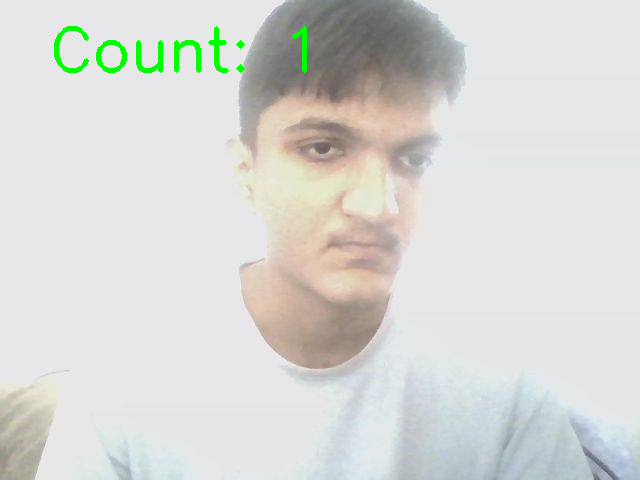

In [ ]:
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode
from google.colab.patches import cv2_imshow # Use this for Colab

# --- 1. LOAD THE NEW FINE-TUNED MODEL ---
print(f"Loading the new fine-tuned model from: {BEST_MODEL_FINETUNED_PATH}")
try:
    # We must have the CSRNet class defined for this to work
    model = CSRNet().to(device)
    model.load_state_dict(torch.load(BEST_MODEL_FINETUNED_PATH, map_location=device))
    model.eval()
    print("Model loaded successfully.")
except NameError:
    print("\n--- ERROR ---")
    print("It looks like 'CSRNet' is not defined.")
    print("Please re-run the cell that defines the 'CSRNet' class (Step 2.4) first, then run this cell again.")
    # Stop execution
    raise
except FileNotFoundError:
    print("\n--- ERROR ---")
    print(f"Could not find model at: {BEST_MODEL_FINETUNED_PATH}")
    print("Please make sure Step 2.5 (fine-tuning) ran successfully.")
    # Stop execution
    raise
# ------------------------------------------

def take_photo(filename='photo.jpg', quality=0.8):
    js = Javascript('''
        async function takePhoto(quality) {
            const div = document.createElement('div');
            const capture = document.createElement('button');
            capture.textContent = 'Capture';
            div.appendChild(capture);

            const video = document.createElement('video');
            video.style.display = 'block';
            const stream = await navigator.mediaDevices.getUserMedia({video: true});

            document.body.appendChild(div);
            div.appendChild(video);
            video.srcObject = stream;
            await video.play();

            google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);
            await new Promise((resolve) => capture.onclick = resolve);

            const canvas = document.createElement('canvas');
            canvas.width = video.videoWidth;
            canvas.height = video.videoHeight;
            canvas.getContext('2d').drawImage(video, 0, 0);
            stream.getTracks().forEach(track => track.stop());
            div.remove();
            return canvas.toDataURL('image/jpeg', quality);
        }
    ''')
    display(js)
    data = eval_js('takePhoto({})'.format(quality))
    binary = b64decode(data.split(',')[1])
    with open(filename, 'wb') as f:
        f.write(binary)
    return filename

# --- Main execution ---
try:
    # 2. Take a photo
    img_file = take_photo()
    print(f'Photo saved to {img_file}')

    # 3. Load the photo
    frame = cv2.imread(img_file)

    # 4. Process with the NEW model
    # (This needs the 'process_frame' function to be defined)
    pred_count = process_frame(frame)

    # 5. Draw alerts and count
    color = (0, 255, 0) # Green
    alert_text = ""

    # We can use a lower threshold for sparse scenes
    if pred_count > 50:
        color = (0, 0, 255) # Red
        alert_text = "!!! ALERT: OVERCROWDED !!!"

    # Let's round the count to the nearest whole number
    final_count = round(pred_count)

    cv2.putText(frame, f"Count: {final_count}", (50, 70),
                cv2.FONT_HERSHEY_SIMPLEX, 2, color, 3)
    if alert_text:
        cv2.putText(frame, alert_text, (50, 150),
                    cv2.FONT_HERSHEY_SIMPLEX, 2, (0, 0, 255), 3)

    # 6. Display the final processed image
    print("--- Processed Result ---")
    cv2_imshow(frame)

except NameError as err:
    if 'process_frame' in str(err):
        print("\n--- ERROR ---")
        print("It looks like 'process_frame' is not defined.")
        print("Please re-run the cell that defines the 'process_frame' function (Step 3.2) first, then run this cell again.")
    else:
        print(f'An error occurred: {err}')
except Exception as err:
    print(f'An error occurred: {err}')

In [ ]:
# --- 1. LOAD THE FINE-TUNED MODEL (if needed) ---
# (This just re-loads the model in case your runtime reset)
try:
    model
    print("Model already loaded.")
except NameError:
    print("Model not found, reloading...")
    model = CSRNet().to(device)
    model.load_state_dict(torch.load(BEST_MODEL_FINETUNED_PATH, map_location=device))
    model.eval()
    print("Model loaded successfully.")
# ------------------------------------------

# --- Main execution ---
try:
    # 2. Take a photo
    img_file = take_photo()
    print(f'Photo saved to {img_file}')

    # 3. Load the photo
    frame = cv2.imread(img_file)

    # 4. Process with the fine-tuned model
    pred_count = process_frame(frame)
    final_count = round(pred_count)

    # 5. Draw alerts and count
    color = (0, 255, 0) # Green
    alert_text = ""

    # --- 6. NEW ALERT LOGIC ---
    if final_count > CROWD_LIMIT:
        color = (0, 0, 255) # Red
        alert_text = "!!! ALERT: OVERCROWDED !!!"

        # Check if cooldown has passed
        current_time = time.time()
        if (current_time - last_alert_time) > ALERT_COOLDOWN:
            print("!!! CROWD LIMIT EXCEEDED - TRIGGERING ALERTS !!!")

            # Trigger alerts
            play_sound_alert()
            send_email_alert(
                subject="CROWD ALERT - OVERCROWDING DETECTED",
                body=f"An overcrowding event was detected.\nEstimated Count: {final_count}\nLimit: {CROWD_LIMIT}"
            )

            # Reset the cooldown timer
            last_alert_time = current_time
        else:
            print(f"Overcrowded (Count: {final_count}), but in alert cooldown period.")

    # 7. Draw text on the image
    cv2.putText(frame, f"Count: {final_count}", (50, 70),
                cv2.FONT_HERSHEY_SIMPLEX, 2, color, 3)
    if alert_text:
        cv2.putText(frame, alert_text, (50, 150),
                    cv2.FONT_HERSHEY_SIMPLEX, 2, (0, 0, 255), 3)

    # 8. Display the final processed image
    print("--- Processed Result ---")
    cv2_imshow(frame)

except Exception as err:
    print(f'An error occurred: {err}')

Model already loaded.
An error occurred: name 'take_photo' is not defined


In [ ]:
import smtplib
import ssl
import time
from email.message import EmailMessage
from IPython.display import display, HTML
import getpass

# --- 1. Define Sound Alert Function ---
def play_sound_alert():
    """Uses Javascript to make the browser speak an alert."""
    print("--- PLAYING SOUND ALERT ---")
    js_code = """
    <script>
    const
    utterance = new SpeechSynthesisUtterance('Alert! Overcrowded zone detected!');
    speechSynthesis.speak(utterance);
    </script>
    """
    display(HTML(js_code))

# --- 2. Define Email Alert Function ---
# (This function will use the credentials defined below)
def send_email_alert(subject, body):
    """Sends an email alert using the user's credentials."""
    print(f"--- SENDING EMAIL ALERT to {EMAIL_RECEIVER} ---")

    # Create the email
    msg = EmailMessage()
    msg.set_content(body)
    msg['Subject'] = subject
    msg['From'] = EMAIL_SENDER
    msg['To'] = EMAIL_RECEIVER

    # Send the email
    try:
        context = ssl.create_default_context()
        with smtplib.SMTP_SSL("smtp.gmail.com", 465, context=context) as server:
            server.login(EMAIL_SENDER, EMAIL_PASSWORD)
            server.send_message(msg)
        print("--- Email Alert Sent Successfully ---")
    except Exception as e:
        print(f"\n--- ERROR: FAILED TO SEND EMAIL ---")
        print(f"Error: {e}")
        print("Please check: 1. Your email address. 2. Your 16-digit App Password.")

# --- 3. Enter Your Credentials (Securely) ---
print("Please enter your email credentials for sending alerts.")
EMAIL_SENDER = input("Enter your Gmail address (e.g., your_email@gmail.com): ")
EMAIL_PASSWORD = getpass.getpass("Enter your 16-digit Google App Password: ")
EMAIL_RECEIVER = input("Enter the email to send alerts TO (can be the same email): ")

# --- 4. Define Alert Cooldown ---
# This is CRITICAL to prevent spamming your email.
# It will only send one alert every 5 minutes (300 seconds).
ALERT_COOLDOWN = 300  # in seconds
last_alert_time = 0

print("\nAlert system is ready. `last_alert_time` is set to 0.")

Please enter your email credentials for sending alerts.
Enter your Gmail address (e.g., your_email@gmail.com): aarishbhanwadia5@gmail.com
Enter your 16-digit Google App Password: ··········
Enter the email to send alerts TO (can be the same email): aarishbhanwadia1@gmail.com

Alert system is ready. `last_alert_time` is set to 0.


In [ ]:
import time
import os
import subprocess
from tqdm import tqdm
from base64 import b64encode
from IPython.display import HTML, display

# --- 1. DEFINE PATHS (This was the missing part) ---
# Make sure DRIVE_PROJECT_PATH is defined from Step 1.2
VIDEO_FOLDER_PATH = os.path.join(DRIVE_PROJECT_PATH,'ShanghaiTech','part_A','train_data')
VIDEO_NAME = 'my_test_video.mp4'
VIDEO_PATH = os.path.join(VIDEO_FOLDER_PATH, VIDEO_NAME)

OUTPUT_VIDEO_PATH = os.path.join(DRIVE_PROJECT_PATH, 'output_video_finetuned.avi')
MP4_OUTPUT_PATH = os.path.join(DRIVE_PROJECT_PATH, 'output_video_finetuned.mp4')
# ---------------------------------------------------

print("\n--- Starting Video Processing (FAST Version with Frame Skipping) ---")

# --- 2. SETTINGS ---
FRAME_PROCESS_RATE = 5
CROWD_LIMIT = 100
ALERT_COOLDOWN = 300  # 5 minutes
last_alert_time = 0

# Variables to hold the "last known" count for skipped frames
last_pred_count = 0
last_final_count = 0
last_alert_text = ""
last_color = (0, 255, 0) # Green
frame_counter = 0

# --- 3. CHECK FILE ---
if not os.path.exists(VIDEO_PATH):
    print(f"--- ERROR: Could not find video at: {VIDEO_PATH} ---")
else:
    print("--- SUCCESS: Video Found ---")
    print(f"Starting video processing. Will process {FRAME_PROCESS_RATE} frames per second.")

    cap = cv2.VideoCapture(VIDEO_PATH)
    frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = int(cap.get(cv2.CAP_PROP_FPS))

    # Calculate how many frames to skip
    if fps < FRAME_PROCESS_RATE:
        skip_interval = 1 # Don't skip if video FPS is low
    else:
        skip_interval = fps // FRAME_PROCESS_RATE

    fourcc = cv2.VideoWriter_fourcc(*'MJPG')
    out = cv2.VideoWriter(OUTPUT_VIDEO_PATH, fourcc, fps, (frame_width, frame_height))
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

    # --- 4. FRAME LOOP ---
    for _ in tqdm(range(total_frames), desc="Processing Video Frames"):
        ret, frame = cap.read()
        if not ret:
            break

        frame_counter += 1

        # --- 5. FRAME SKIPPING LOGIC ---
        if frame_counter % skip_interval == 0:

            # This is a frame we process
            pred_count = process_frame(frame)
            final_count = round(pred_count)

            # Update the "last known" values
            last_pred_count = pred_count
            last_final_count = final_count

            last_color = (0, 255, 0) # Green
            last_alert_text = ""

            # --- 6. ALERT LOGIC ---
            if final_count > CROWD_LIMIT:
                last_color = (0, 0, 255) # Red
                last_alert_text = "!!! ALERT: OVERCROWDED !!!"

                current_time = time.time()
                if (current_time - last_alert_time) > ALERT_COOLDOWN:
                    print(f"\n!!! CROWD LIMIT EXCEEDED (Count: {final_count}) - TRIGGERING ALERTS !!!")

                    play_sound_alert()
                    send_email_alert(
                        subject="CROWD ALERT - OVERCROWDING DETECTED",
                        body=f"An overcrowding event was detected.\nEstimated Count: {final_count}\nLimit: {CROWD_LIMIT}"
                    )

                    last_alert_time = current_time

        # --- 7. DRAW ON EVERY FRAME ---
        cv2.putText(frame, f"Count: {last_final_count}", (50, 70),
                    cv2.FONT_HERSHEY_SIMPLEX, 2, last_color, 3)
        if last_alert_text:
            cv2.putText(frame, last_alert_text, (50, 150),
                        cv2.FONT_HERSHEY_SIMPLEX, 2, (0, 0, 255), 3)

        out.write(frame)

    cap.release()
    out.release()
    cv2.destroyAllWindows()
    print("Video processing complete.")

    # --- 8. CONVERT & DISPLAY ---
    print("Converting to MP4 for display...")
    subprocess.run([
        'ffmpeg', '-y', '-i', OUTPUT_VIDEO_PATH,
        '-c:v', 'libx264', MP4_OUTPUT_PATH
    ], stdout=subprocess.DEVNULL, stderr=subprocess.DEVNULL)

    print("Displaying final video:")
    mp4 = open(MP4_OUTPUT_PATH, 'rb').read()
    data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
    display(HTML(f"""
    <video width=600 controls>
          <source src="{data_url}" type="video/mp4">
    </video>
    """))


--- Starting Video Processing (FAST Version with Frame Skipping) ---
--- SUCCESS: Video Found ---
Starting video processing. Will process 5 frames per second.


Processing Video Frames:   0%|          | 0/301 [00:00<?, ?it/s]


!!! CROWD LIMIT EXCEEDED (Count: 277) - TRIGGERING ALERTS !!!
--- PLAYING SOUND ALERT ---


--- SENDING EMAIL ALERT to aarishbhanwadia1@gmail.com ---


Processing Video Frames:   1%|▏         | 4/301 [00:06<07:38,  1.54s/it]

--- Email Alert Sent Successfully ---


Processing Video Frames:  73%|███████▎  | 220/301 [05:01<01:44,  1.29s/it]


!!! CROWD LIMIT EXCEEDED (Count: 262) - TRIGGERING ALERTS !!!
--- PLAYING SOUND ALERT ---


--- SENDING EMAIL ALERT to aarishbhanwadia1@gmail.com ---


Processing Video Frames:  74%|███████▍  | 224/301 [05:09<01:58,  1.54s/it]

--- Email Alert Sent Successfully ---


Processing Video Frames: 100%|██████████| 301/301 [06:53<00:00,  1.37s/it]


Video processing complete.
Converting to MP4 for display...
Displaying final video:
